# 1.16c: Spacetime Displacement Diagrams

**Goal:** Visualize token motion as spacetime worldlines—unroll the wandering paths into 1D.

## The Spacetime Diagram

**X-axis:** Cumulative path length (total distance traveled)
- Start at x=0 (all tokens begin at same point in "traveled distance")
- Move rightward as token accumulates displacement
- Final x-position = total path length over 100 steps

**Y-axis:** Training step (time)
- Flows upward from t=0 to t=100

**Worldline:** Each token draws a curve from (0, 0) to (total_distance, 100)
- **Slope = velocity** (steep = fast, shallow = slow)
- **Curvature = acceleration** (bending right = speeding up, bending left = slowing down)
- **Horizontal = stationary** (no motion)

## Three Diagrams

1. **All tokens** (50,257 worldlines)
2. **Untrained tokens only** (19,667 worldlines—expect cluster near x=0)
3. **Trained tokens only** (30,590 worldlines—expect spread)

## What We Expect to See

- **Untrained:** Tight bundle near x=0 (minimal motion)
- **Trained:** Spreading fan of worldlines (different velocities)
- **Overall shape:** Cone expanding rightward as tokens escape

## Parameters

In [10]:
# Training data
TRAINING_DATA_PATH = "../tensors/Wordybird/1.12c_wordybird_1.safetensors"
TOKEN_MASK_PATH = "../tensors/Wordybird/fineweb_token_masks.safetensors"

# Visualization
PLOT_DPI = 200
ALPHA = 0.05
LINEWIDTH = 0.5
FIGSIZE = (16, 10)  # Wide and tall for worldlines

## Imports

In [2]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from safetensors.torch import load_file

print("✓ Imports complete")

✓ Imports complete


## Load Data

In [3]:
print("Loading training data...\n")

# Training data
data = load_file(TRAINING_DATA_PATH)
embeddings = data['embeddings'].float()  # (n_steps, vocab_size, hidden_dim)
n_steps, vocab_size, hidden_dim = embeddings.shape

# Token masks
mask_data = load_file(TOKEN_MASK_PATH)
trained_indices = mask_data['trained_indices']
untrained_indices = mask_data['untrained_indices']

n_trained = len(trained_indices)
n_untrained = len(untrained_indices)

print(f"✓ Loaded data")
print(f"  Steps: {n_steps}")
print(f"  Vocab: {vocab_size:,} ({n_trained:,} trained, {n_untrained:,} untrained)")
print(f"  Hidden dim: {hidden_dim}")

Loading training data...

✓ Loaded data
  Steps: 101
  Vocab: 50,257 (30,590 trained, 19,667 untrained)
  Hidden dim: 64


## Compute Cumulative Displacement (All Tokens)

In [4]:
print("\nComputing cumulative displacement for all tokens...\n")

# Step-wise displacements for ALL tokens
deltas = embeddings[1:] - embeddings[:-1]  # (n_steps-1, vocab_size, hidden_dim)
step_distances = torch.norm(deltas, p=2, dim=2)  # (n_steps-1, vocab_size)

# Cumulative distance traveled (integral of speed)
# Prepend zero so we have position at each timestep including t=0
cumulative_distance = torch.cat([
    torch.zeros(1, vocab_size),
    torch.cumsum(step_distances, dim=0)
], dim=0)  # (n_steps, vocab_size)

print(f"✓ Computed cumulative displacement")
print(f"  Shape: {cumulative_distance.shape}")
print(f"  Max distance traveled: {cumulative_distance[-1].max().item():.6f}")
print(f"  Mean final distance: {cumulative_distance[-1].mean().item():.6f}")


Computing cumulative displacement for all tokens...

✓ Computed cumulative displacement
  Shape: torch.Size([101, 50257])
  Max distance traveled: 0.410644
  Mean final distance: 0.282348


## Extract Trained and Untrained Cumulative Distances

In [5]:
# Trained tokens
trained_distances = cumulative_distance[:, trained_indices]  # (n_steps, n_trained)

# Untrained tokens
untrained_distances = cumulative_distance[:, untrained_indices]  # (n_steps, n_untrained)

print(f"\nTrained tokens:")
print(f"  Final distances: mean={trained_distances[-1].mean().item():.6f}, max={trained_distances[-1].max().item():.6f}")

print(f"\nUntrained tokens:")
print(f"  Final distances: mean={untrained_distances[-1].mean().item():.6f}, max={untrained_distances[-1].max().item():.6f}")


Trained tokens:
  Final distances: mean=0.244192, max=0.410644

Untrained tokens:
  Final distances: mean=0.341695, max=0.352653


## Spacetime Diagram 1: All Tokens

**50,257 tokens × 101 timesteps = 5,075,957 points**

Let's rock.


Plotting spacetime diagram: ALL TOKENS (50,257 worldlines)...

  Plotted 5,000 / 50,257 worldlines...
  Plotted 10,000 / 50,257 worldlines...
  Plotted 15,000 / 50,257 worldlines...
  Plotted 20,000 / 50,257 worldlines...
  Plotted 25,000 / 50,257 worldlines...
  Plotted 30,000 / 50,257 worldlines...
  Plotted 35,000 / 50,257 worldlines...
  Plotted 40,000 / 50,257 worldlines...
  Plotted 45,000 / 50,257 worldlines...
  Plotted 50,000 / 50,257 worldlines...


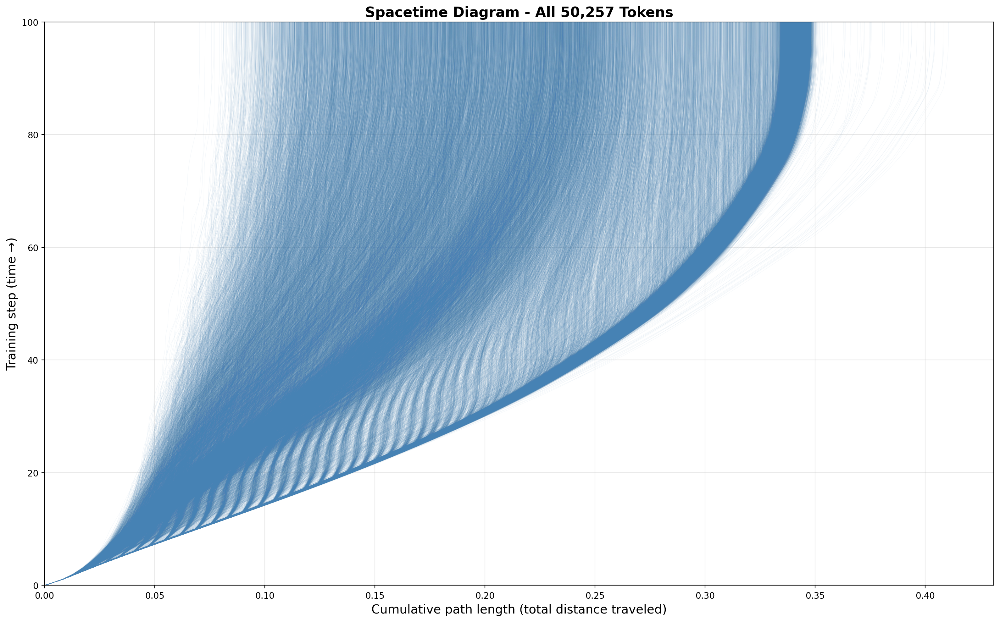


✓ All tokens diagram complete


In [16]:
print(f"\nPlotting spacetime diagram: ALL TOKENS ({vocab_size:,} worldlines)...\n")

fig, ax = plt.subplots(figsize=FIGSIZE, dpi=PLOT_DPI)

timesteps = np.arange(n_steps)

# Plot every single token worldline
for i in range(vocab_size):
    ax.plot(cumulative_distance[:, i].numpy(), timesteps, 
            color='steelblue', alpha=ALPHA, linewidth=LINEWIDTH)
    
    # Progress indicator every 5000 tokens
    if (i + 1) % 5000 == 0:
        print(f"  Plotted {i+1:,} / {vocab_size:,} worldlines...")

ax.set_xlabel('Cumulative path length (total distance traveled)', fontsize=14)
ax.set_ylabel('Training step (time →)', fontsize=14)
ax.set_title(f'Spacetime Diagram - All {vocab_size:,} Tokens', fontsize=16, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.set_xlim(left=0)
ax.set_ylim(0, n_steps-1)

plt.tight_layout()
plt.show()

print(f"\n✓ All tokens diagram complete")

## Spacetime Diagram 2: Untrained Tokens Only

**19,667 tokens × 101 timesteps = 1,986,367 points**

(*I sleep*)


Plotting spacetime diagram: UNTRAINED TOKENS (19,667 worldlines)...

  Plotted 2,000 / 19,667 worldlines...
  Plotted 4,000 / 19,667 worldlines...
  Plotted 6,000 / 19,667 worldlines...
  Plotted 8,000 / 19,667 worldlines...
  Plotted 10,000 / 19,667 worldlines...
  Plotted 12,000 / 19,667 worldlines...
  Plotted 14,000 / 19,667 worldlines...
  Plotted 16,000 / 19,667 worldlines...
  Plotted 18,000 / 19,667 worldlines...


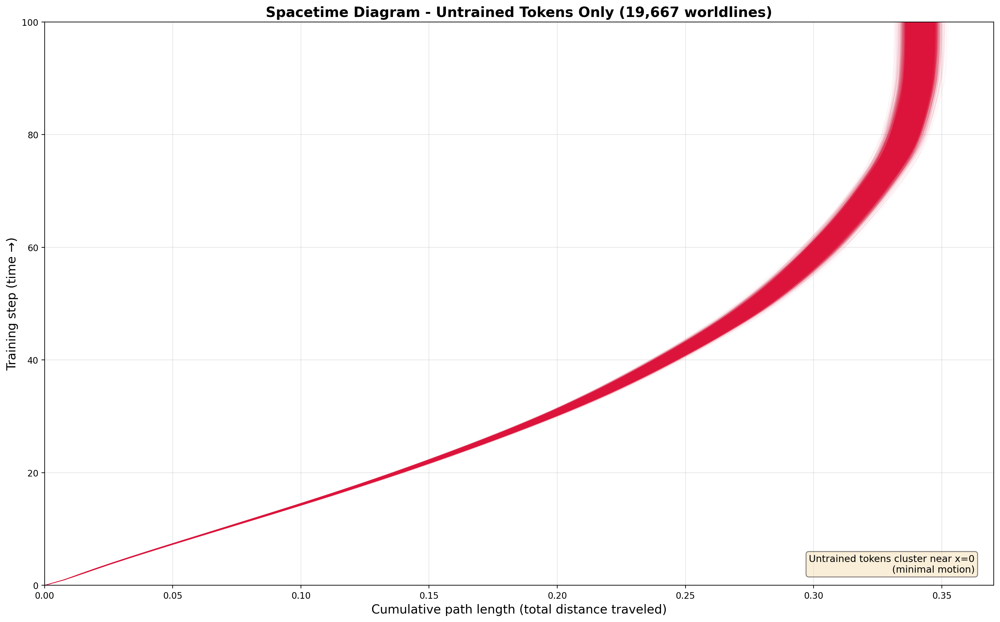


✓ Untrained tokens diagram complete


In [17]:
print(f"\nPlotting spacetime diagram: UNTRAINED TOKENS ({n_untrained:,} worldlines)...\n")

fig, ax = plt.subplots(figsize=FIGSIZE, dpi=PLOT_DPI)

# Plot untrained token worldlines
for i in range(n_untrained):
    ax.plot(untrained_distances[:, i].numpy(), timesteps, 
            color='crimson', alpha=ALPHA, linewidth=LINEWIDTH)
    
    if (i + 1) % 2000 == 0:
        print(f"  Plotted {i+1:,} / {n_untrained:,} worldlines...")

ax.set_xlabel('Cumulative path length (total distance traveled)', fontsize=14)
ax.set_ylabel('Training step (time →)', fontsize=14)
ax.set_title(f'Spacetime Diagram - Untrained Tokens Only ({n_untrained:,} worldlines)', fontsize=16, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.set_xlim(left=0)
ax.set_ylim(0, n_steps-1)

# Add annotation
ax.text(0.98, 0.02, 'Untrained tokens cluster near x=0\n(minimal motion)', 
        transform=ax.transAxes, fontsize=11, verticalalignment='bottom', horizontalalignment='right',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.show()

print(f"\n✓ Untrained tokens diagram complete")

## Spacetime Diagram 3: Trained Tokens Only

**30,590 tokens × 101 timesteps = 3,089,590 points**

(*REAL SHIT*)


Plotting spacetime diagram: TRAINED TOKENS (30,590 worldlines)...

  Plotted 5,000 / 30,590 worldlines...
  Plotted 10,000 / 30,590 worldlines...
  Plotted 15,000 / 30,590 worldlines...
  Plotted 20,000 / 30,590 worldlines...
  Plotted 25,000 / 30,590 worldlines...
  Plotted 30,000 / 30,590 worldlines...


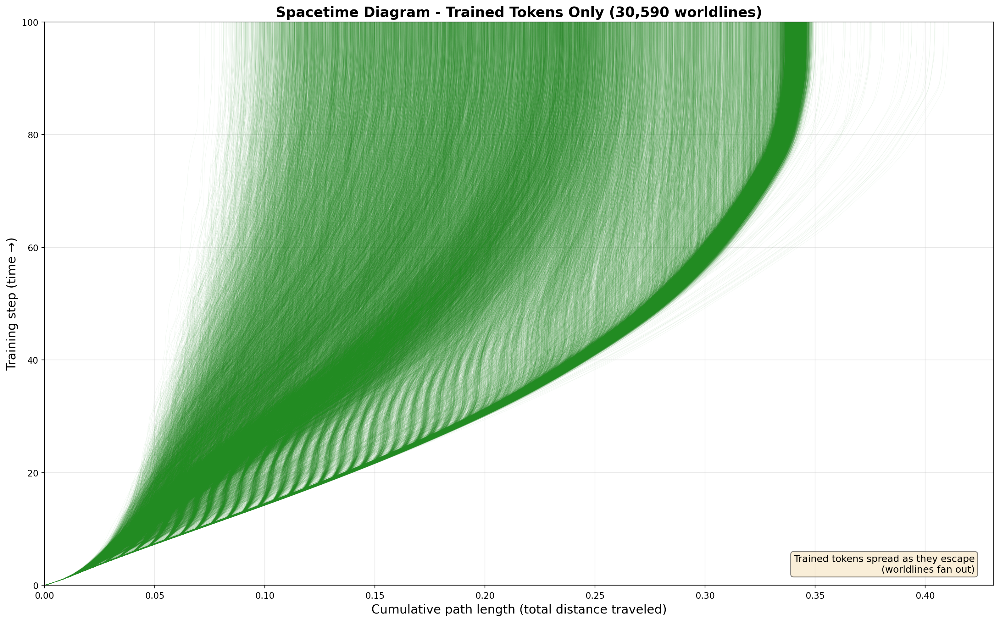


✓ Trained tokens diagram complete


In [18]:
print(f"\nPlotting spacetime diagram: TRAINED TOKENS ({n_trained:,} worldlines)...\n")

fig, ax = plt.subplots(figsize=FIGSIZE, dpi=PLOT_DPI)

# Plot trained token worldlines
for i in range(n_trained):
    ax.plot(trained_distances[:, i].numpy(), timesteps, 
            color='forestgreen', alpha=ALPHA, linewidth=LINEWIDTH)
    
    if (i + 1) % 5000 == 0:
        print(f"  Plotted {i+1:,} / {n_trained:,} worldlines...")

ax.set_xlabel('Cumulative path length (total distance traveled)', fontsize=14)
ax.set_ylabel('Training step (time →)', fontsize=14)
ax.set_title(f'Spacetime Diagram - Trained Tokens Only ({n_trained:,} worldlines)', fontsize=16, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.set_xlim(left=0)
ax.set_ylim(0, n_steps-1)

# Add annotation
ax.text(0.98, 0.02, 'Trained tokens spread as they escape\n(worldlines fan out)', 
        transform=ax.transAxes, fontsize=11, verticalalignment='bottom', horizontalalignment='right',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.show()

print(f"\n✓ Trained tokens diagram complete")

## Summary Statistics

In [19]:
print(f"\n{'='*80}")
print(f"SPACETIME DISPLACEMENT SUMMARY")
print(f"{'='*80}\n")

print(f"Dataset: {TRAINING_DATA_PATH}")
print(f"  Steps: {n_steps}")
print(f"  Tokens: {vocab_size:,} ({n_trained:,} trained, {n_untrained:,} untrained)")
print()

print(f"Final cumulative distances (at t={n_steps-1}):")
print()

print(f"All tokens:")
all_final = cumulative_distance[-1]
print(f"  Mean: {all_final.mean().item():.6f}")
print(f"  Std: {all_final.std().item():.6f}")
print(f"  Range: [{all_final.min().item():.6f}, {all_final.max().item():.6f}]")
print()

print(f"Trained tokens:")
trained_final = trained_distances[-1]
print(f"  Mean: {trained_final.mean().item():.6f}")
print(f"  Std: {trained_final.std().item():.6f}")
print(f"  Range: [{trained_final.min().item():.6f}, {trained_final.max().item():.6f}]")
print()

print(f"Untrained tokens:")
untrained_final = untrained_distances[-1]
print(f"  Mean: {untrained_final.mean().item():.6f}")
print(f"  Std: {untrained_final.std().item():.6f}")
print(f"  Range: [{untrained_final.min().item():.6f}, {untrained_final.max().item():.6f}]")
print()

# Ratio
ratio = trained_final.mean() / (untrained_final.mean() + 1e-10)
print(f"Trained/Untrained mean distance ratio: {ratio:.1f}×")
print()

print(f"Interpretation:")
if ratio > 10:
    print(f"  ✓ Trained tokens travel {ratio:.1f}× farther than untrained")
    print(f"  ✓ Clear separation in spacetime diagrams")
elif ratio > 2:
    print(f"  → Trained tokens travel moderately farther ({ratio:.1f}×)")
else:
    print(f"  ⚠️  Trained and untrained tokens move similar distances")

print(f"\n{'='*80}")


SPACETIME DISPLACEMENT SUMMARY

Dataset: ../tensors/Wordybird/1.12c_wordybird_1.safetensors
  Steps: 101
  Tokens: 50,257 (30,590 trained, 19,667 untrained)

Final cumulative distances (at t=100):

All tokens:
  Mean: 0.282348
  Std: 0.076752
  Range: [0.070464, 0.410644]

Trained tokens:
  Mean: 0.244192
  Std: 0.077157
  Range: [0.070464, 0.410644]

Untrained tokens:
  Mean: 0.341695
  Std: 0.002685
  Range: [0.331441, 0.352653]

Trained/Untrained mean distance ratio: 0.7×

Interpretation:
  ⚠️  Trained and untrained tokens move similar distances

